#logist regression task 

https://archive.ics.uci.edu/ml/datasets/Activity+Recognition+system+based+on+Multisensor+data+fusion+%28AReM%29#
    
Task Logistic Regression
~~~~~~~~~~~~~~~~~~~~~~~~~~~
1. WAP to read folder name and make a label in the csv with folder name
2. Remove unneccesarry info in Automated way
3. No other algorithm must be used other than Logistic Regression
4. Try to utilize multiple solvers and make multiple models
5. Provide the best models
6. EDA and all must be done accordingly
Note: No manual approaches will be appreciated

In [461]:
import pandas as pd 
import numpy as np
from numpy import mean
from numpy import std
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle

In [162]:
import zipfile
import os


In [167]:
pwd()

'C:\\Full_Stack\\ML\\Logistic Regression\\extract\\cycling'

In [174]:
os.chdir('C:\Full_Stack\ML\Logistic Regression')

In [175]:
path=os.getcwd()
file_name='\\AReM.zip'

In [176]:
path+file_name

'C:\\Full_Stack\\ML\\Logistic Regression\\AReM.zip'

In [177]:
with zipfile.ZipFile(path+file_name,'r') as zip:
    zip.extractall('C:\\Full_Stack\\ML\\Logistic Regression\\extract')
    

In [178]:
path

'C:\\Full_Stack\\ML\\Logistic Regression'

In [179]:
import glob
import pandas as pd

In [180]:
list=[]
for root,dir,files in os.walk(path+'\\extract'):
    
    for file in dir:
        list.append(file)
print(list)

['bending1', 'bending2', 'cycling', 'lying', 'sitting', 'standing', 'walking']


In [181]:
list[0]

'bending1'

In [152]:
df=pd.read_csv('C:\\Full_Stack\\ML\\Logistic Regression\\extract\\bending1\\dataset1.csv',skiprows=4)

In [155]:
i='bending1'
df['label']=i

In [156]:
df

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,bending1,label
0,0,39.25,0.43,22.75,0.43,33.75,1.3,bending1,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.0,bending1,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.0,bending1,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.0,bending1,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.0,bending1,bending1
...,...,...,...,...,...,...,...,...,...
475,118750,43.33,0.47,25.00,0.00,30.00,0.0,bending1,bending1
476,119000,43.50,0.50,25.50,0.50,30.00,0.0,bending1,bending1
477,119250,43.50,0.50,24.75,0.43,30.00,0.0,bending1,bending1
478,119500,43.50,0.50,24.33,0.47,30.00,0.0,bending1,bending1


In [183]:
data_frame=pd.DataFrame()
content=[]
headers=[]
for i in list:
    files=glob.glob(path+'\\extract\\'+i+"\\*.csv")
    for filenames in files:
        try:
            df=pd.read_csv(filenames,skiprows=4,index_col=None)
            df['label']=i
            content.append(df)
        except Exception as e:
            print(e)
    
data_frame=pd.concat(content)            
        
data_frame       


Error tokenizing data. C error: Expected 7 fields in line 485, saw 8

Error tokenizing data. C error: Expected 7 fields in line 485, saw 8



,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0,39.25,0.43,22.75,0.43,33.75,1.30,bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,bending1
...,...,...,...,...,...,...,...,...
475,118750,31.50,1.66,12.50,3.20,14.25,4.44,walking
476,119000,27.33,1.25,11.33,0.94,20.00,4.00,walking
477,119250,37.80,7.68,14.20,2.48,17.25,0.83,walking
478,119500,33.75,1.30,15.75,5.21,16.50,2.69,walking


In [184]:
data_frame.shape

(41279, 8)

In [186]:
ProfileReport(data_frame)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [339]:
data_frame['label'].value_counts()

lying       7200
walking     7200
standing    7200
sitting     7199
cycling     6240
bending1    3360
bending2    2880
Name: label, dtype: int64

In [341]:
!pip install imbalanced-learn

You should consider upgrading via the 'c:\users\sssso\anaconda3\python.exe -m pip install --upgrade pip' command.


In [343]:
X.dtypes

# Columns: time     object
avg_rss12          float64
var_rss12          float64
avg_rss13          float64
var_rss13          float64
avg_rss23          float64
var_rss23          float64
dtype: object

In [ ]:
# Removing Duplicate rows and unnecessary columns

In [189]:
data_frame.isnull().sum()

# Columns: time      0
avg_rss12          480
var_rss12          480
avg_rss13          480
var_rss13          480
avg_rss23          480
var_rss23          480
label                0
dtype: int64

In [350]:
data_frame[data_frame['avg_rss12'].isnull()]

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,0 32.50 0.50 0.00 0.00 19.00 1.00,NaN,NaN,NaN,NaN,NaN,NaN,bending2
1,250 32.50 0.50 0.00 0.00 18.50 0.50,NaN,NaN,NaN,NaN,NaN,NaN,bending2
2,500 32.75 0.43 1.00 0.00 18.00 0.00,NaN,NaN,NaN,NaN,NaN,NaN,bending2
3,750 32.50 0.50 0.00 0.00 17.50 0.50,NaN,NaN,NaN,NaN,NaN,NaN,bending2
4,1000 32.50 0.50 7.50 0.50 17.50 0.87,NaN,NaN,NaN,NaN,NaN,NaN,bending2
...,...,...,...,...,...,...,...,...
475,118750 28.67 0.47 4.67 1.25 17.33 0.47,NaN,NaN,NaN,NaN,NaN,NaN,bending2
476,119000 27.50 0.50 5.50 2.50 17.25 1.30,NaN,NaN,NaN,NaN,NaN,NaN,bending2
477,119250 28.00 0.00 6.67 0.94 17.00 1.00,NaN,NaN,NaN,NaN,NaN,NaN,bending2
478,119500 28.00 0.00 5.00 0.82 17.00 0.71,NaN,NaN,NaN,NaN,NaN,NaN,bending2


In [351]:
df1=data_frame.dropna()

In [352]:
df1.shape

(40799, 8)

In [353]:
df1[df1.duplicated()].sort_values('avg_rss12')

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
190,47500,23.50,1.50,10.25,1.30,20.50,0.87,lying
190,47500,23.50,1.50,10.25,1.30,20.50,0.87,lying
214,53500,23.75,0.43,10.50,1.12,11.50,0.87,lying
214,53500,23.75,0.43,10.50,1.12,11.50,0.87,lying
237,59250,24.00,0.00,9.67,0.94,10.67,0.94,lying
...,...,...,...,...,...,...,...,...
322,80500,54.00,0.00,12.80,1.17,20.60,0.49,lying
323,80750,54.00,0.00,12.50,0.87,18.50,0.50,lying
310,77500,54.00,0.00,12.50,0.50,18.00,0.00,lying
280,70000,54.00,0.00,14.50,0.50,20.67,0.47,lying


In [354]:
df1.isnull().sum()

# Columns: time    0
avg_rss12          0
var_rss12          0
avg_rss13          0
var_rss13          0
avg_rss23          0
var_rss23          0
label              0
dtype: int64

In [355]:
df2=df1.drop_duplicates()

In [356]:
df2.shape

(37440, 8)

In [357]:
df2.drop(columns='# Columns: time',inplace=True)

C:\Users\SSSSO\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [254]:
ProfileReport(df2)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

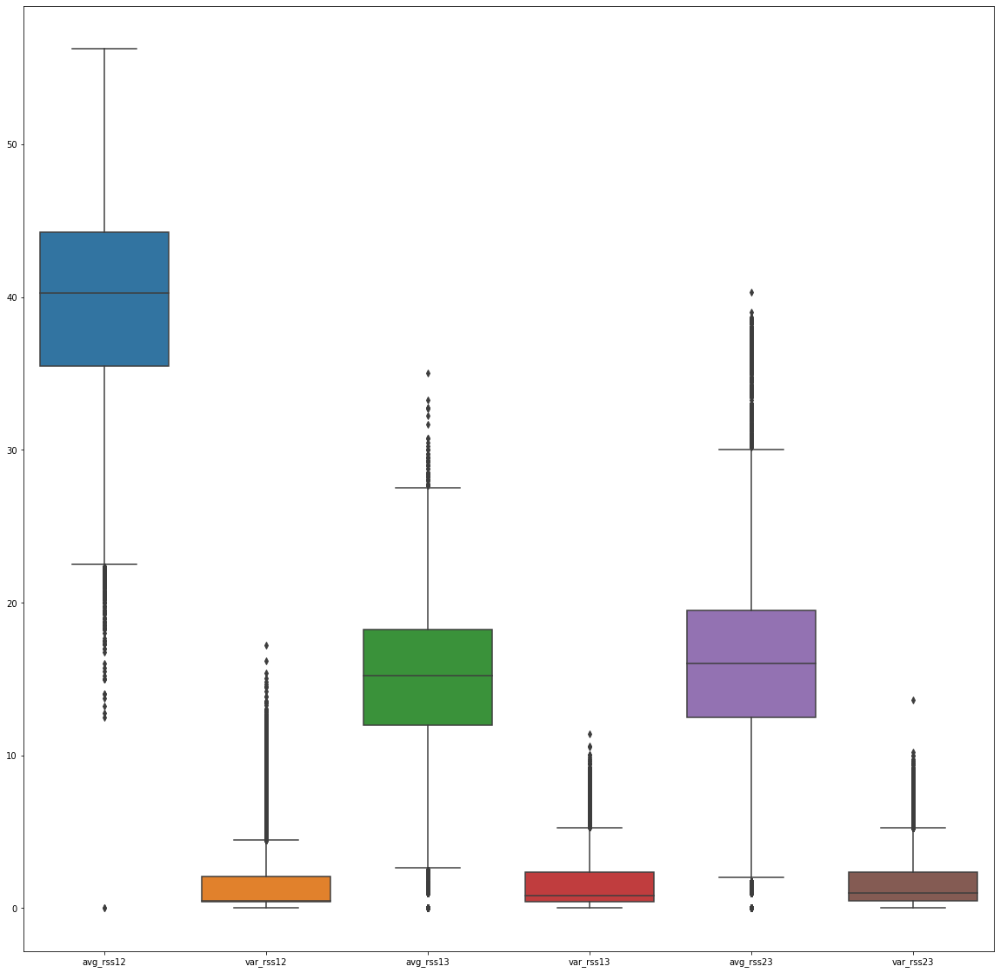

In [358]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df2 , ax = ax)

In [361]:
df2.sample(1)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
467,44.5,0.5,18.0,0.0,2.0,1.22,standing


In [362]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(y)
df2['label']=le.transform(df2['label'])

<ipython-input-362-48a4c3f2d526>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['label']=le.transform(df2['label'])


In [363]:
df2.sample(1)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
346,25.25,2.95,16.25,4.92,21.25,4.21,6


In [364]:
col=[]
for i in df2.columns:
    col.append(i)
def outlier_removal(self,data):
        def outlier_limits(col):
            Q3, Q1 = np.nanpercentile(col, [98,5])
            IQR= Q3-Q1
            UL= Q3+1.5*IQR
            LL= Q1-1.5*IQR
            return UL, LL

        for column in data.columns:
            if data[column].dtype != 'int64':
                UL, LL= outlier_limits(data[column])
                data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])

        return data

In [366]:
data=outlier_removal(col,df2)

<ipython-input-364-42d8d0e40a95>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])
<ipython-input-364-42d8d0e40a95>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])
<ipython-input-364-42d8d0e40a95>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

In [367]:
data.isnull().sum()

avg_rss12    0
var_rss12    0
avg_rss13    0
var_rss13    0
avg_rss23    0
var_rss23    0
label        0
dtype: int64

In [391]:
data['label'].value_counts()

5.0    7200
6.0    7200
4.0    7199
2.0    5760
3.0    4321
0.0    3360
1.0    2400
Name: label, dtype: int64

# Handling imbalance dataset

In [392]:
x=data.drop(columns=['label'])
y=data['label']
x

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,39.25,0.43,22.75,0.43,33.75,1.30
1,39.25,0.43,23.00,0.00,33.00,0.00
2,39.25,0.43,23.25,0.43,33.00,0.00
3,39.50,0.50,23.00,0.71,33.00,0.00
4,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...
475,31.50,1.66,12.50,3.20,14.25,4.44
476,27.33,1.25,11.33,0.94,20.00,4.00
477,37.80,7.68,14.20,2.48,17.25,0.83
478,33.75,1.30,15.75,5.21,16.50,2.69


In [369]:
data.shape

(37440, 7)

In [373]:
y

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
475    6.0
476    6.0
477    6.0
478    6.0
479    6.0
Name: label, Length: 37440, dtype: float64

In [370]:
x.shape

(37440, 6)

In [374]:
y.shape

(37440,)

In [393]:
print(x.shape)
x.isnull().sum()

(37440, 6)


avg_rss12    0
var_rss12    0
avg_rss13    0
var_rss13    0
avg_rss23    0
var_rss23    0
dtype: int64

In [395]:
y.value_counts()

5.0    7200
6.0    7200
4.0    7199
2.0    5760
3.0    4321
0.0    3360
1.0    2400
Name: label, dtype: int64

In [398]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority')
x_sm, y_sm = smote.fit_resample(x, y)

y_sm.value_counts()

5.0    7200
6.0    7200
1.0    7200
4.0    7199
2.0    5760
3.0    4321
0.0    3360
Name: label, dtype: int64

In [399]:
data.sample(1)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
135,42.5,0.5,21.0,0.0,33.75,1.3,0.0


In [406]:
# Class count
count_class_5, count_class_6,count_class_4,count_class_2,count_class_3,count_class_0,count_class_1 = data.label.value_counts()

# Divide by class
df_class_5 = data[data['label'] == 5]
df_class_6 = data[data['label'] == 6]
df_class_4 = data[data['label'] == 4]
df_class_3 = data[data['label'] == 3]
df_class_2 = data[data['label'] == 2]
df_class_0 = data[data['label'] == 0]
df_class_1 = data[data['label'] == 1]

In [407]:
print(count_class_5,count_class_6,count_class_4,count_class_3,count_class_2,count_class_1,count_class_0)

7200 7200 7199 4321 5760 2400 3360


In [410]:
df_class_1.label.value_counts()

1.0    2400
Name: label, dtype: int64

In [412]:
df_class_0_over = df_class_0.sample(count_class_5, replace=True)
df_class_1_over = df_class_1.sample(count_class_5, replace=True)
df_class_2_over = df_class_2.sample(count_class_5, replace=True)
df_class_3_over = df_class_3.sample(count_class_5, replace=True)
df_class_4_over = df_class_4.sample(count_class_5, replace=True)

df_test_over = pd.concat([df_class_5, df_class_0_over,df_class_1_over,df_class_2_over,df_class_3_over,df_class_4_over], axis=0)

print('Random over-sampling:')
print(df_test_over.label.value_counts())

Random over-sampling:
0.0    7200
4.0    7200
2.0    7200
5.0    7200
3.0    7200
1.0    7200
Name: label, dtype: int64


In [413]:
df_test_over.sample(2)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
380,45.0,0.0,13.00,6.36,16.00,2.12,4.0
303,42.0,0.0,5.67,0.47,14.67,0.47,4.0


In [416]:
x=df_test_over.drop(columns=['label'])
y=df_test_over['label']

In [429]:
print(x.shape,y.shape)

(43200, 6) (43200,)


<AxesSubplot:>

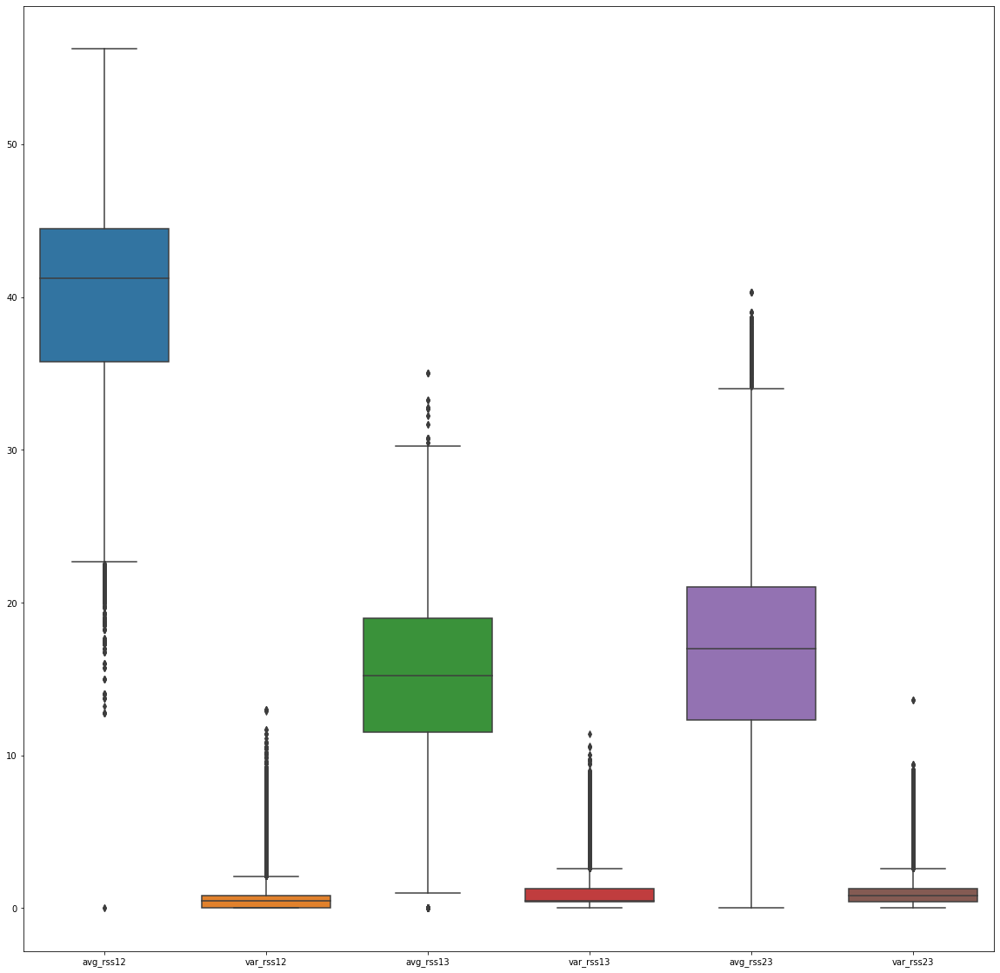

In [417]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = x , ax = ax)

In [419]:
ProfileReport(x)

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [420]:
scalar = StandardScaler()

x_scaled = scalar.fit_transform(x)
#ProfileReport(pd.DataFrame(scalar.fit_transform(x)))

<AxesSubplot:>

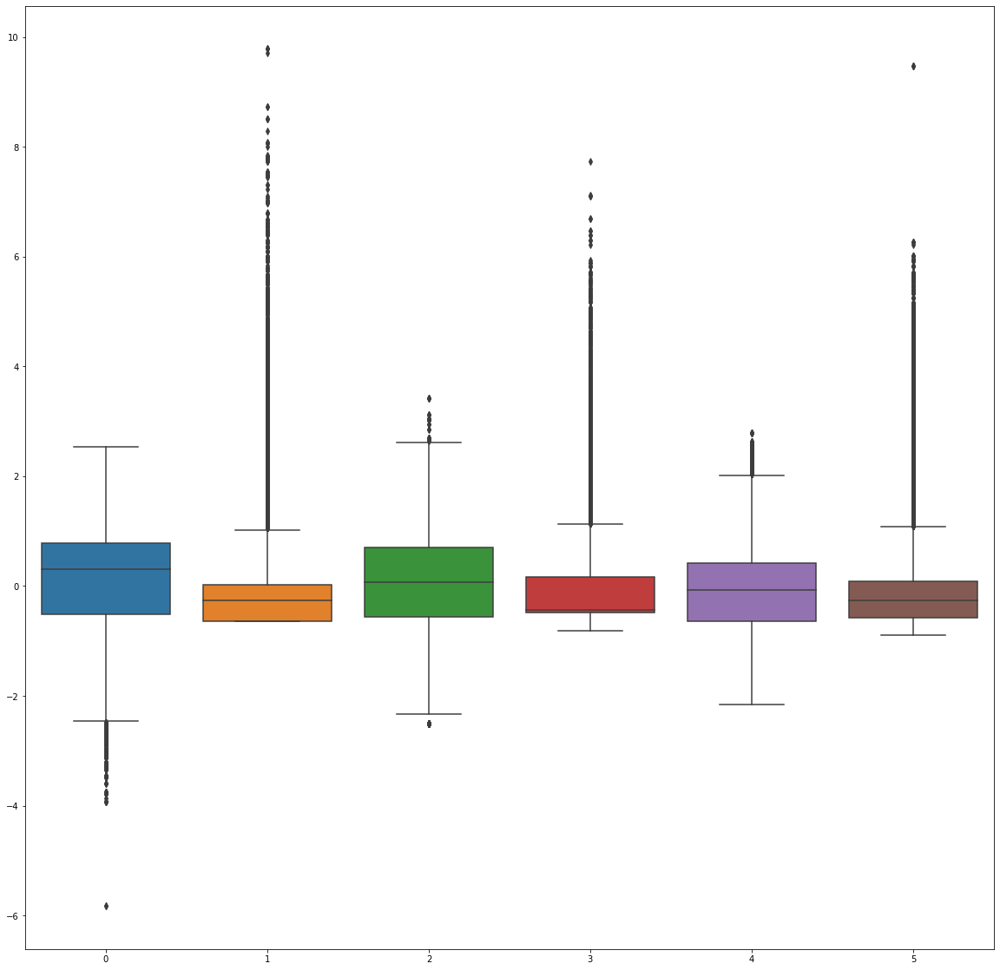

In [421]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = x_scaled , ax = ax)

In [422]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [426]:
vif_score(x)

,FEATURE,VIF_SCORE
0,avg_rss12,1.061679
1,var_rss12,1.577824
2,avg_rss13,1.402494
3,var_rss13,1.618124
4,avg_rss23,1.400910
5,var_rss23,1.576366


In [309]:
# So we don't have multi colinearity as values are less than 10
# Vif_Score= 1/[1-R^2]

In [427]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled , y , test_size = .20 , random_state = 144)

In [428]:
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

(34560, 6) (34560,) (8640, 6) (8640,)


In [430]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear',multi_class='ovr')

In [431]:
logr_liblinear.fit(x_train,y_train )

[LibLinear]

LogisticRegression(multi_class='ovr', solver='liblinear', verbose=1)

In [432]:
y_pred_liblinear=logr_liblinear.predict(x_test)

In [433]:
logr_liblinear.predict_proba([x_test[1]])

array([[8.76672573e-02, 8.51856980e-01, 2.70331115e-03, 7.04168742e-04,
        5.31106757e-02, 3.95760674e-03]])

In [434]:
logr_liblinear.predict([x_test[1]])

array([1.])

In [438]:
y_test.iloc[1]

1.0

In [439]:
confusion_matrix(y_test,y_pred_liblinear)

array([[1346,    9,   17,    1,   36,   61],
       [ 116, 1168,   75,   71,   13,   19],
       [   5,   62, 1239,    1,   33,   15],
       [  13,   85,   11, 1249,   11,   84],
       [ 162,  159,   77,  226,  251,  611],
       [  44,   11,   63,  189,  161,  946]], dtype=int64)

In [440]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
precision_liblinear = precision_score(y_test, y_pred_liblinear,average='weighted')
recall_liblinear = recall_score(y_test, y_pred_liblinear,average='weighted')
f1_liblinear = f1_score(y_test, y_pred_liblinear,average='weighted')
print("f1 score for liblinear model is",f1_liblinear)
print("recall score for liblinear model is",recall_liblinear)
print("precision score for liblinear model is",precision_liblinear)

f1 score for liblinear model is 0.6891832409392686
recall score for liblinear model is 0.7174768518518518
precision score for liblinear model is 0.6948231180215542


In [446]:
logr_lbfgs = LogisticRegression(verbose=1,solver='lbfgs',multi_class='multinomial',penalty='l2')

In [447]:
logr_lbfgs.fit(x_train,y_train )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished


LogisticRegression(multi_class='multinomial', verbose=1)

In [448]:
y_pred_lbfgs=logr_lbfgs.predict(x_test)

In [449]:
logr_lbfgs.score(x_test,y_test)

0.7392361111111111

In [450]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
precision_lbfgs = precision_score(y_test, y_pred_lbfgs,average='weighted')
recall_lbfgs = recall_score(y_test, y_pred_lbfgs,average='weighted')
f1_lbfgs = f1_score(y_test, y_pred_lbfgs,average='weighted')
print("f1 score for liblinear model is",f1_lbfgs)
print("recall score for liblinear model is",recall_lbfgs)
print("precision score for liblinear model is",precision_lbfgs)

f1 score for liblinear model is 0.7350648399543406
recall score for liblinear model is 0.7392361111111111
precision score for liblinear model is 0.7325323022326776


In [454]:
from sklearn.model_selection import cross_val_score
def evaluate_model(model,x,y):
    return cross_val_score(model,x,y,scoring='accuracy',cv=10,n_jobs=1)

In [463]:
scores=evaluate_model(logr_lbfgs,x_train,y_train)
print(mean(scores),std(scores))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

0.7475405092592593 0.005510234823561099
